In [12]:
import os
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import sys
sys.path.append('/home/yuanyuan.fu/bin/scripts') 
import plot_spatial_histograms as histplot
from scalebar_util import add_scalebar
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42

root_directory = '/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/BasalGanglia_paper_package/data/human/ATAC/Astro_subGroup/spatial'
os.chdir(root_directory)

In [11]:
adata_human = sc.read_h5ad(root_directory + "/hmba_release_format_human_cirro_h5ad_20250624.h5ad")
adata_human

AnnData object with n_obs × n_vars = 6992128 × 315
    obs: 'x', 'y', 'brain_section_label', 'brain_section_barcode', 'slab', 'block', 'set', 'z_order', 'total_counts', 'total_counts_genes', 'n_genes_by_counts', 'total_counts_Blank', 'pct_counts_Blank', 'genes_filter', 'counts_filter', 'blanks_filter', 'qc_pass', 'doublets_filter', 'qc_pass_and_singlet', 'doublet_singlet_score_diff', 'doublet_diff_threshold', 'hierarchy_consistent', 'Neighborhood', 'Neighborhood_bootstrapping_probability', 'Neighborhood_correlation_coefficient', 'Class', 'Class_bootstrapping_probability', 'Class_correlation_coefficient', 'Subclass', 'Subclass_bootstrapping_probability', 'Subclass_correlation_coefficient', 'Group', 'Group_bootstrapping_probability', 'Group_correlation_coefficient', 'cluster_id', 'cluster_id_bootstrapping_probability', 'cluster_id_correlation_coefficient', 'Neighborhood_entropy', 'Class_entropy', 'Subclass_entropy', 'Group_entropy', 'cluster_id_entropy', 'STAligner_mclust_res_10_knn_15',

### show the anatomical structure

In [3]:
region_cols = ['STR', 'GPe', 'GPi', 'VP', 'SN', 'STH']

# Create the new 'anatomical_structure' column
def assign_region(row):
    for region in region_cols:
        if row[region]:
            return region
    return 'adjacent'

adata_human.obs['anatomical_structure'] = adata_human.obs.apply(assign_region, axis=1)
adata_human.obs['anatomical_structure'].value_counts()

anatomical_structure
STR         3322914
adjacent    3065314
GPe          342864
SN            90966
GPi           89045
VP            43161
STH           37864
Name: count, dtype: int64

In [4]:
adata_human_structure = adata_human[adata_human.obs['qc_pass']].copy() 

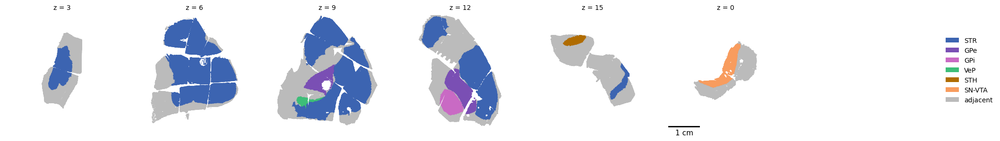

In [5]:
from matplotlib.patches import Patch

# Region mapping
anatomical_to_color_key = {
    'STR': 'STR',
    'GPe': 'GPe',
    'GPi': 'GPi',
    'VP': 'VeP',
    'SN': 'SN-VTA',
    'STH': 'STH',
    'adjacent': 'adjacent'
}
region_color_map = {
    "STR": "#3C64B1", 
    "GPe": "#7A4FB4", 
    "GPi": "#C96AC4",
    "SN-VTA": "#F89C5E", 
    "STH": "#B06C00",
    "VeP": "#3DBE78", 
    "adjacent": "#BBBBBB"
}
ordered_color_keys = ['STR', 'GPe', 'GPi', 'VeP', 'STH', 'SN-VTA', 'adjacent']
selected_sections = [3, 6, 9, 12, 15, 0]
#selected_sections = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 0]

# Define fixed spatial canvas size (in µm)
plot_size_um = 300 * 120  # 36000 µm
half_size = plot_size_um / 2

# Create subplots
fig, axes = plt.subplots(1, len(selected_sections), figsize=(20, 3), sharex=True, sharey=True)
if len(selected_sections) == 1:
    axes = [axes]

for ax, z in zip(axes, selected_sections):
    adata_subset = adata_human_structure[adata_human_structure.obs['z_order'] == z].copy()

    # Assign region colors
    adata_subset.obs['region_color_key'] = adata_subset.obs['anatomical_structure'].map(anatomical_to_color_key)
    adata_subset.obs['region_color_key'] = pd.Categorical(
        adata_subset.obs['region_color_key'],
        categories=ordered_color_keys,
        ordered=True
    )

    # Get spatial coordinates
    coords = adata_subset.obsm['spatial_grid']
    colors = adata_subset.obs['region_color_key'].map(region_color_map)

    # Compute bounding box center for consistent alignment
    x_min, x_max = coords[:, 0].min(), coords[:, 0].max()
    y_min, y_max = coords[:, 1].min(), coords[:, 1].max()
    center_x = (x_min + x_max) / 2
    center_y = (y_min + y_max) / 2
    center = np.array([center_x, center_y])

    # Shift to center of fixed-size canvas
    shifted_coords = coords - center + half_size

    # Plot
    ax.scatter(
        shifted_coords[:, 0],
        shifted_coords[:, 1],
        c=colors,
        s=1,
        linewidth=0,
        rasterized=True
    )
    ax.set_xlim(0, plot_size_um)
    ax.set_ylim(0, plot_size_um)
    ax.set_title(f'z = {z}', fontsize=10)
    ax.set_aspect('equal')
    ax.axis('off')

# Legend
legend_elements = [Patch(facecolor=region_color_map[k], label=k) for k in ordered_color_keys]
fig.legend(
    handles=legend_elements,
    loc='center left',
    bbox_to_anchor=(1.01, 0.5),
    borderaxespad=0,
    frameon=False
)

# Add scalebar
add_scalebar(
    axes[-1],
    matchx=False,
    matchy=False,
    hidex=True,
    hidey=True,
    loc='lower middle',
    fontsize=11,
    barcolor='black',
    barwidth=4,
    offset=(0.0, 0.0),
    sizex=10000,
    labelx='1 cm'
)

# Save and display
output_dir = root_directory + '/results/figures_astro_enrichment'
os.makedirs(output_dir, exist_ok=True)

fig.savefig(
    f"{output_dir}/anatomical_structure_onlyATLASreleaseplot.pdf",
    dpi=300,
    bbox_inches='tight'
)

plt.tight_layout()
plt.subplots_adjust(wspace=0.0, right=0.85)
plt.show()


In [6]:
from matplotlib.patches import Patch

# --- same grid & size as the cluster figure ---
z_orders = [3, 6, 9, 12, 15, 0]
ncols, nrows = 7, 1                     # same as cluster
panel_w, panel_h = 3, 4                 # same as cluster
figsize = (ncols * panel_w, nrows * panel_h)

# --- plotting ---
fig, axes = plt.subplots(nrows, ncols, figsize=figsize, sharex=True, sharey=True)
axes = axes.flatten()
used_axes = []

plot_size_um = 300 * 120
half_size = plot_size_um / 2

for i, (ax, z) in enumerate(zip(axes, z_orders)):
    used_axes.append(i)
    adata_subset = adata_human_structure[adata_human_structure.obs['z_order'] == z].copy()

    adata_subset.obs['region_color_key'] = adata_subset.obs['anatomical_structure'].map(anatomical_to_color_key)
    adata_subset.obs['region_color_key'] = pd.Categorical(
        adata_subset.obs['region_color_key'],
        categories=ordered_color_keys,
        ordered=True
    )

    coords = adata_subset.obsm['spatial_grid']
    colors = adata_subset.obs['region_color_key'].map(region_color_map)

    # center & shift to fixed canvas (same as before)
    center = np.array([(coords[:,0].min()+coords[:,0].max())/2,
                       (coords[:,1].min()+coords[:,1].max())/2])
    shifted = coords - center + half_size

    ax.scatter(shifted[:,0], shifted[:,1], c=colors, s=1, linewidth=0, rasterized=True)
    ax.set_xlim(0, plot_size_um); ax.set_ylim(0, plot_size_um)
    ax.set_aspect('equal'); ax.axis('off')
    ax.set_title(f'z={z}', fontsize=10)

# delete the unused last axis (to keep the same 7-column grid look)
for j in range(len(z_orders), len(axes)):
    fig.delaxes(axes[j])

# --- scalebar on the last used subplot (same as cluster) ---
add_scalebar(
    axes[used_axes[-1]],
    matchx=False, matchy=False, hidex=True, hidey=True,
    loc='lower middle', fontsize=11, barcolor='black', barwidth=4,
    offset=(0.0, 0.0), sizex=10000, labelx='1 cm'
)

# --- use the SAME right strip as the cluster figure ---
# cluster used right=0.9 and a right strip (0.92~0.935). Do the same here.
plt.subplots_adjust(hspace=0.02, wspace=0.0, right=0.9)

# put the legend into that right strip so the export bbox matches
legend_elements = [Patch(facecolor=region_color_map[k], label=k) for k in ordered_color_keys]
legend_ax = fig.add_axes([0.92, 0.25, 0.03, 0.5])  # mirror cluster's colorbar slot
legend_ax.axis('off')
leg = legend_ax.legend(handles=legend_elements, loc='center', frameon=False, fontsize=10)

# optional overall title to mirror cluster suptitle style
fig.suptitle('Anatomical structures', fontsize=14)

# save exactly like the cluster figure
outdir = root_directory + '/results/figures_astro_enrichment'
os.makedirs(outdir, exist_ok=True)
fig.savefig(f"{outdir}/anatomical_structure_onlyATLASreleaseplot2.pdf",
            dpi=300, bbox_inches='tight')
plt.close(fig)


### Enrichment distribution of Human BG Astrocyte

#### cluster level

In [4]:
adata_human_astro = adata_human[
    (adata_human.obs['Group'] == 'Astrocyte') &
    (adata_human.obs['qc_pass']) # & (adata_human.obs['abc_atlas_release']) # to keep adjacent regions    
].copy()


selected_sections = [3, 6, 9, 12, 15, 0]
adata_human_astro = adata_human_astro[adata_human_astro.obs['z_order'].isin(selected_sections)].copy()
adata_human_astro

AnnData object with n_obs × n_vars = 198386 × 315
    obs: 'x', 'y', 'brain_section_label', 'brain_section_barcode', 'slab', 'block', 'set', 'z_order', 'total_counts', 'total_counts_genes', 'n_genes_by_counts', 'total_counts_Blank', 'pct_counts_Blank', 'genes_filter', 'counts_filter', 'blanks_filter', 'qc_pass', 'doublets_filter', 'qc_pass_and_singlet', 'doublet_singlet_score_diff', 'doublet_diff_threshold', 'hierarchy_consistent', 'Neighborhood', 'Neighborhood_bootstrapping_probability', 'Neighborhood_correlation_coefficient', 'Class', 'Class_bootstrapping_probability', 'Class_correlation_coefficient', 'Subclass', 'Subclass_bootstrapping_probability', 'Subclass_correlation_coefficient', 'Group', 'Group_bootstrapping_probability', 'Group_correlation_coefficient', 'cluster_id', 'cluster_id_bootstrapping_probability', 'cluster_id_correlation_coefficient', 'Neighborhood_entropy', 'Class_entropy', 'Subclass_entropy', 'Group_entropy', 'cluster_id_entropy', 'STAligner_mclust_res_10_knn_15', 

In [8]:
desired_Cluster_order = ['Human-14', 'Human-7', 'Human-31', #GM STR
                         'Human-160', 'Human-450', 'Human-149', # GM exSTR
                         'Human-159', 'Human-145', 'Human-152', 'Human-146', 'Human-452', 'Human-150', 
                         'Human-479', 'Human-485', 'Human-472', 'Human-230', 'Human-28', 'Human-231', 'Human-227', #wm
                         'Human-143', 'Human-232' #mixed
                        ]
adata_human_astro.obs['Cluster'] = pd.Categorical(adata_human_astro.obs['Cluster'], categories=desired_Cluster_order, ordered=True)

print(adata_human_astro.obs['Cluster'].cat.categories)
print(adata_human_astro.obs['Cluster'].dtype)

Index(['Human-14', 'Human-7', 'Human-31', 'Human-160', 'Human-450',
       'Human-149', 'Human-159', 'Human-145', 'Human-152', 'Human-146',
       'Human-452', 'Human-150', 'Human-479', 'Human-485', 'Human-472',
       'Human-230', 'Human-28', 'Human-231', 'Human-227', 'Human-143',
       'Human-232'],
      dtype='object')
category


In [9]:
# Calculate the overal proportion of astrocytes that belong to each astrocyte cluster
astro_cluster_proportions_global = adata_human_astro.obs.groupby('Cluster', observed=True).size() / adata_human_astro.shape[0]
astro_cluster_proportions_global = astro_cluster_proportions_global.to_dict()
astro_cluster_proportions_global

{'Human-14': 0.2522909882753823,
 'Human-7': 0.15973405381428124,
 'Human-31': 0.07052917040516972,
 'Human-160': 0.06740899055376892,
 'Human-450': 0.02710876775578922,
 'Human-149': 0.015333743308499593,
 'Human-159': 0.01871099775185749,
 'Human-145': 0.020384502938715434,
 'Human-152': 0.007530773340860746,
 'Human-146': 0.003830915487988064,
 'Human-452': 0.0018096035002469933,
 'Human-150': 0.004365227384996925,
 'Human-479': 0.08443136108394746,
 'Human-485': 0.017486112931356042,
 'Human-472': 0.025500791386488968,
 'Human-230': 0.020712147026503886,
 'Human-28': 0.07260088917564747,
 'Human-231': 0.06543808534876452,
 'Human-227': 0.0009073220892603309,
 'Human-143': 0.007142641113788271,
 'Human-232': 0.056742915326686356}

In [10]:
plt.close('all')
obs_field = 'Cluster'

z_orders = [6, 9, 12, 15, 0] # [3, 6, 9, 12, 15, 0]
n_z = len(z_orders)
ncols = 7
nrows = int(np.ceil(n_z / ncols))
figsize_per_row = 4
figsize = (ncols * 3, nrows * figsize_per_row)  # 

for cat in adata_human_astro.obs[obs_field].cat.categories:
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.flatten()
    used_axes = []

    for i, sec in enumerate(z_orders):
        adata_sec = adata_human_astro[adata_human_astro.obs['z_order'] == sec].copy()
        ax = axes[i]
        used_axes.append(i)

        fig.patch.set_facecolor("white") 
        _ = histplot.make_2D_hist_enrichment_log2(
            adata_sec, 
            obs_field=obs_field, 
            category=cat,
            coords_obsm_key='spatial_grid',
            binsize=300,
            imshow_size=300*120,
            global_propor_dict=astro_cluster_proportions_global,
            vlims=(-4,4),
            cmap='PiYG_r',
            no_cells_color="white",#"#ebebeb", #"#d3d3d3",
            no_category_color="#d9d9d9", #"#d9d2c3",#BBBBBB #too heavy for the cells that not in this category.
            show_colorbar=False,  # 
            ax=ax,
        )
        ax.set_title(f'z={sec}', fontsize=10)

    # delete unusable ax
    for j, ax in enumerate(axes):
        if j not in used_axes:
            fig.delaxes(ax)

    # add scale bar
    add_scalebar(
        axes[used_axes[-1]],   # last subplot
        matchx=False,
        matchy=False,
        hidex=True,
        hidey=True,
        loc='lower middle',
        fontsize=11,
        barcolor='black',
        barwidth=4,
        offset=(0.0, 0.0),
        sizex=10000,        # 5000 um
        labelx='1 cm'
    )

    # add sharing colorbar
    cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])  # [left, bottom, width, height]
    norm = plt.Normalize(vmin=-4, vmax=4)
    sm = plt.cm.ScalarMappable(cmap='PiYG_r', norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label('log2(enrichment)', fontsize=12)

    fig.suptitle(f'Cluster = {cat}', fontsize=14)
    plt.subplots_adjust(hspace=0.02, wspace=0.0, right=0.9)
    
    os.makedirs(root_directory + '/results/figures_astro_enrichment', exist_ok=True)
    fig.savefig(
        root_directory + f'/results/figures_astro_enrichment/astrocyte_histogram_enrichment_log2_{obs_field}_{cat}_4sections.pdf', 
        dpi=300,
        bbox_inches='tight',
    )
    plt.close(fig)


#### subGroup level

In [11]:
Cluster_to_subGroup = {
    "Human-14": "GM STR",
    "Human-7": "GM STR",
    "Human-31": "GM STR",
    "Human-160": "GM exSTR",
    "Human-146": "GM exSTR",
    "Human-149": "GM exSTR",
    "Human-450": "GM exSTR",
    "Human-159": "GM exSTR",
    "Human-150": "GM exSTR",
    "Human-145": "GM exSTR",
    "Human-452": "GM exSTR",
    "Human-152": "GM exSTR",
    "Human-28": "WM",
    "Human-231": "WM",
    "Human-479": "WM",
    "Human-472": "WM",
    "Human-230": "WM",
    "Human-485": "WM",
    "Human-227": "WM",
    "Human-143": "mixed",
    "Human-232": "mixed",
}

adata_human_astro.obs["subGroup"] = adata_human_astro.obs["Cluster"].copy()
adata_human_astro.obs["subGroup"] = adata_human_astro.obs["Cluster"].map(Cluster_to_subGroup)


In [12]:
adata_human_astro_c19 = adata_human_astro[~adata_human_astro.obs['subGroup'].isin(['mixed'])].copy()

desired_subGroup_order = ['GM STR', 'GM exSTR', 'WM']
adata_human_astro_c19.obs['subGroup'] = pd.Categorical(adata_human_astro_c19.obs['subGroup'], categories=desired_subGroup_order, ordered=True)
adata_human_astro_c19

AnnData object with n_obs × n_vars = 185712 × 315
    obs: 'x', 'y', 'brain_section_label', 'brain_section_barcode', 'slab', 'block', 'set', 'z_order', 'total_counts', 'total_counts_genes', 'n_genes_by_counts', 'total_counts_Blank', 'pct_counts_Blank', 'genes_filter', 'counts_filter', 'blanks_filter', 'qc_pass', 'doublets_filter', 'qc_pass_and_singlet', 'doublet_singlet_score_diff', 'doublet_diff_threshold', 'hierarchy_consistent', 'Neighborhood', 'Neighborhood_bootstrapping_probability', 'Neighborhood_correlation_coefficient', 'Class', 'Class_bootstrapping_probability', 'Class_correlation_coefficient', 'Subclass', 'Subclass_bootstrapping_probability', 'Subclass_correlation_coefficient', 'Group', 'Group_bootstrapping_probability', 'Group_correlation_coefficient', 'cluster_id', 'cluster_id_bootstrapping_probability', 'cluster_id_correlation_coefficient', 'Neighborhood_entropy', 'Class_entropy', 'Subclass_entropy', 'Group_entropy', 'cluster_id_entropy', 'STAligner_mclust_res_10_knn_15', 

In [13]:
# Calculate the overal proportion of astrocytes that belong to each astrocyte cluster
astro_subGroup_proportions_global = adata_human_astro_c19.obs.groupby('subGroup', observed=True).size() / adata_human_astro_c19.shape[0]
astro_subGroup_proportions_global = astro_subGroup_proportions_global.to_dict()
astro_subGroup_proportions_global

{'GM STR': 0.5154863444473162,
 'GM exSTR': 0.17784526578788662,
 'WM': 0.3066683897647971}

In [16]:
plt.close('all')
obs_field = 'subGroup'

z_orders = [3, 6, 9, 12, 15, 0]
n_z = len(z_orders)
ncols = 7
nrows = int(np.ceil(n_z / ncols))
figsize_per_row = 4
figsize = (ncols * 3, nrows * figsize_per_row)  # 

for cat in adata_human_astro_c19.obs[obs_field].cat.categories:
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.flatten()
    used_axes = []

    for i, sec in enumerate(z_orders):
        adata_sec = adata_human_astro_c19[adata_human_astro_c19.obs['z_order'] == sec].copy()
        ax = axes[i]
        used_axes.append(i)

        fig.patch.set_facecolor("white") 
        _ = histplot.make_2D_hist_enrichment_log2(
            adata_sec, 
            obs_field=obs_field, 
            category=cat,
            coords_obsm_key='spatial_grid',
            binsize=300,
            imshow_size=300*120,
            global_propor_dict=astro_subGroup_proportions_global,
            vlims=(-3,3),
            cmap='PiYG_r',
            no_cells_color="white",#"#ebebeb", #f5f5f5"
            no_category_color="#d9d9d9",#"black",
            show_colorbar=False,  # 
            ax=ax,
        )
        ax.set_title(f'z={sec}', fontsize=10)

    # delete unusable ax
    for j, ax in enumerate(axes):
        if j not in used_axes:
            fig.delaxes(ax)
    
    # add scalebar 
    add_scalebar(
        axes[used_axes[-1]],
        matchx=False,
        matchy=False,
        hidex=True,
        hidey=True,
        loc='lower middle',
        fontsize=11,
        barcolor='black',
        barwidth=4,
        offset=(0.0, 0.0),  
        sizex=10000,
        labelx='1 cm'
    )

    # add shared colorbar
    cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])  # [left, bottom, width, height]
    norm = plt.Normalize(vmin=-3, vmax=3)
    sm = plt.cm.ScalarMappable(cmap='PiYG_r', norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label('log2(enrichment)', fontsize=12)

    fig.suptitle(f'Cluster = {cat}', fontsize=14)
    plt.subplots_adjust(hspace=0.02, wspace=0.0, right=0.9)
    
    os.makedirs(root_directory + '/results/figures_astro_enrichment', exist_ok=True)
    fig.savefig(
        root_directory + f'/results/figures_astro_enrichment/astrocyte_histogram_enrichment_log2_{obs_field}_{cat}.pdf', 
        dpi=300,
        bbox_inches='tight',
    )
    plt.close(fig)


In [19]:
import os
import numpy as np
import matplotlib.pyplot as plt

plt.close('all')
obs_field = 'subGroup'

z_orders = [3, 6, 9, 12, 15, 0]
n_z = len(z_orders)
ncols = 7
nrows = int(np.ceil(n_z / ncols))
figsize_per_row = 4
figsize = (ncols * 3, nrows * figsize_per_row)  # width x height in inches

# ---------- CONFIG ----------
# Expand the per-category range by this margin (set to 0.5 if you prefer)
MARGIN = 1.0
# If True, floor/ceil after applying margin to get clean integer edges
ROUND_TO_INT = False
# Very wide preview vlims to keep the plotting function happy
PREVIEW_LIMS = (-10, 10)
# ----------------------------

def _collect_vlims_for_category(cat, z_orders, default=(-4, 4), margin=1.0, round_to_int=False):
    """
    Collect raw min/max for a category across z sections by rendering once on a tiny figure,
    then expand by `margin` for nicer colorbar bounds.

    Returns:
        (vmin, vmax) after applying margin (and optional integer rounding).
    """
    all_mins, all_maxs = [], []

    for sec in z_orders:
        fig_tmp, ax_tmp = plt.subplots(1, 1, figsize=(1, 1))
        try:
            adata_sec = adata_human_astro_c19[adata_human_astro_c19.obs['z_order'] == sec].copy()

            # Render once with a super-wide vlims so the function does not fail
            ret = histplot.make_2D_hist_enrichment_log2(
                adata_sec,
                obs_field=obs_field,
                category=cat,
                coords_obsm_key='spatial_grid',
                binsize=300,
                imshow_size=300*120,
                global_propor_dict=astro_subGroup_proportions_global,
                vlims=PREVIEW_LIMS,
                cmap='PiYG_r',
                no_cells_color="white",
                no_category_color="#d9d9d9",
                show_colorbar=False,
                ax=ax_tmp,
            )

            # Force draw so artists are created
            try:
                fig_tmp.canvas.draw()
            except Exception:
                pass

            # Locate an image-like artist
            im = None
            if hasattr(ret, "get_array") or hasattr(ret, "get_clim"):
                im = ret
            elif len(ax_tmp.images) > 0:
                im = ax_tmp.images[-1]
            elif hasattr(ax_tmp, "collections") and len(ax_tmp.collections) > 0:
                im = ax_tmp.collections[-1]  # e.g., QuadMesh from pcolormesh

            if im is None:
                continue

            arr_min = None
            arr_max = None

            # Prefer the underlying array if accessible
            if hasattr(im, "get_array") and callable(getattr(im, "get_array")):
                arr = im.get_array()
                try:
                    arr = np.asarray(arr, dtype=float)
                    arr = arr[np.isfinite(arr)]
                    if arr.size > 0:
                        arr_min = float(np.min(arr))
                        arr_max = float(np.max(arr))
                except Exception:
                    arr_min = arr_max = None

            # Fallback to clim if array not available
            if (arr_min is None or arr_max is None) and hasattr(im, "get_clim"):
                try:
                    cmin, cmax = im.get_clim()
                    if np.isfinite(cmin) and np.isfinite(cmax):
                        arr_min = cmin if arr_min is None else min(arr_min, cmin)
                        arr_max = cmax if arr_max is None else max(arr_max, cmax)
                except Exception:
                    pass

            if arr_min is not None and arr_max is not None:
                all_mins.append(arr_min)
                all_maxs.append(arr_max)

        finally:
            plt.close(fig_tmp)

    if not all_mins or not all_maxs:
        print(f"[info] Could not infer per-category vlims for '{cat}', using default {default}.")
        raw_vmin, raw_vmax = default
    else:
        raw_vmin = float(np.min(all_mins))
        raw_vmax = float(np.max(all_maxs))

    # Handle edge cases
    if not np.isfinite(raw_vmin) or not np.isfinite(raw_vmax):
        print(f"[info] Non-finite vlims for '{cat}', using default {default}.")
        raw_vmin, raw_vmax = default
    if np.isclose(raw_vmin, raw_vmax):
        eps = max(1e-6, abs(raw_vmin) * 1e-6)
        raw_vmin, raw_vmax = raw_vmin - eps, raw_vmax + eps

    # Apply margin buffer
    vmin = raw_vmin - margin
    vmax = raw_vmax + margin

    # Optional rounding to nicer integer edges
    if round_to_int:
        vmin = np.floor(vmin)
        vmax = np.ceil(vmax)

    return (vmin, vmax)

for cat in adata_human_astro_c19.obs[obs_field].cat.categories:
    # 1) Per-category vlims with margin
    vmin, vmax = _collect_vlims_for_category(
        cat,
        z_orders,
        default=(-4, 4),
        margin=MARGIN,
        round_to_int=ROUND_TO_INT
    )

    # 2) Build the real figure with per-category vlims
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.flatten()
    used_axes = []

    for i, sec in enumerate(z_orders):
        adata_sec = adata_human_astro_c19[adata_human_astro_c19.obs['z_order'] == sec].copy()
        ax = axes[i]
        used_axes.append(i)

        fig.patch.set_facecolor("white")
        _ = histplot.make_2D_hist_enrichment_log2(
            adata_sec,
            obs_field=obs_field,
            category=cat,
            coords_obsm_key='spatial_grid',
            binsize=300,
            imshow_size=300*120,
            global_propor_dict=astro_subGroup_proportions_global,
            vlims=(vmin, vmax),  # per-subGroup color scale with buffer
            cmap='PiYG_r',
            no_cells_color="white",
            no_category_color="#d9d9d9",
            show_colorbar=False,
            ax=ax,
        )
        ax.set_title(f'z={sec}', fontsize=10)

    # 3) Delete unused axes
    for j, ax in enumerate(axes):
        if j not in used_axes:
            fig.delaxes(ax)

    # 4) Add scalebar on the last used axis
    add_scalebar(
        axes[used_axes[-1]],
        matchx=False,
        matchy=False,
        hidex=True,
        hidey=True,
        loc='lower middle',
        fontsize=11,
        barcolor='black',
        barwidth=4,
        offset=(0.0, 0.0),
        sizex=10000,
        labelx='1 cm'
    )

    # 5) Shared colorbar for this subGroup
    cbar_ax = fig.add_axes([0.92, 0.25, 0.015, 0.5])  # [left, bottom, width, height]
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap='PiYG_r', norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label('log2(enrichment)', fontsize=12)

    # 6) Title + layout + save
    fig.suptitle(f'Cluster = {cat}', fontsize=14)
    plt.subplots_adjust(hspace=0.02, wspace=0.0, right=0.9)

    outdir = os.path.join(root_directory, 'results', 'figures_astro_enrichment')
    os.makedirs(outdir, exist_ok=True)
    outfile = os.path.join(outdir, f'astrocyte_histogram_enrichment_log2_{obs_field}_{cat}.pdf')
    fig.savefig(outfile, dpi=300, bbox_inches='tight')
    plt.close(fig)

print("Done. Each subGroup uses its own colorbar range with margin.")


Done. Each subGroup uses its own colorbar range with margin.


### PCs loadings

In [14]:
import os
import anndata as ad
import numpy as np
import xarray as xr
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from collections import defaultdict

import matplotlib.pyplot as plt

import plot_spatial_histograms as histplot

%matplotlib inline

In [15]:
adata_human_astro

AnnData object with n_obs × n_vars = 198386 × 315
    obs: 'x', 'y', 'brain_section_label', 'brain_section_barcode', 'slab', 'block', 'set', 'z_order', 'total_counts', 'total_counts_genes', 'n_genes_by_counts', 'total_counts_Blank', 'pct_counts_Blank', 'genes_filter', 'counts_filter', 'blanks_filter', 'qc_pass', 'doublets_filter', 'qc_pass_and_singlet', 'doublet_singlet_score_diff', 'doublet_diff_threshold', 'hierarchy_consistent', 'Neighborhood', 'Neighborhood_bootstrapping_probability', 'Neighborhood_correlation_coefficient', 'Class', 'Class_bootstrapping_probability', 'Class_correlation_coefficient', 'Subclass', 'Subclass_bootstrapping_probability', 'Subclass_correlation_coefficient', 'Group', 'Group_bootstrapping_probability', 'Group_correlation_coefficient', 'cluster_id', 'cluster_id_bootstrapping_probability', 'cluster_id_correlation_coefficient', 'Neighborhood_entropy', 'Class_entropy', 'Subclass_entropy', 'Group_entropy', 'cluster_id_entropy', 'STAligner_mclust_res_10_knn_15', 

#### Calculate per-cluster, per-section 2D histograms & store in an xarray for access

In [18]:
plt.close('all')

obs_field = 'Cluster'

# same as above, but flip the loop order so sec is outside loop
z_sections = [3, 6, 9, 12, 15, 0]
astro_clusters = adata_human_astro.obs[obs_field].cat.categories

# # make per-section dict for H, xedges, yedges with empty 
cell_type_histograms = {}

for i, z in enumerate(z_sections):

    adata_sec = adata_human_astro[adata_human_astro.obs['z_order']==z].copy()

    hist_list = []
    xedges, yedges = None, None

    for cat in astro_clusters:
        H_cat, xedges_cat, yedges_cat = histplot.calculate_2D_histogram(
            adata_sec,
            obs_field=obs_field,
            category=cat,
            binsize=300,
            normalization=None,
        )
        hist_list.append(H_cat)

        if xedges is None:
            xedges, yedges = xedges_cat, yedges_cat

    # Shape: (n_cell_types, n_y, n_x) → transpose to (n_y, n_x, n_cell_types)
    hist_array = np.stack(hist_list, axis=0).transpose(1, 2, 0)

    da_sec = xr.DataArray(
        hist_array,
        dims=["bin_y", "bin_x", "cell_type"],
        coords={
            "bin_y": np.arange(hist_array.shape[0]),
            "bin_x": np.arange(hist_array.shape[1]),
            "cell_type": astro_clusters,
        },
        attrs={
            "z_order": z,
            "xedges": xedges,
            "yedges": yedges,
            "binsize_um": np.diff(xedges)[0]  # or store binsize directly
        }
    )

    cell_type_histograms[z] = da_sec

#### Flatten xarray for quicker PCA calculation

In [19]:
X_list = []
section_bin_indices = []  # to keep track of (section, y, x) for reassembly

for z, da in cell_type_histograms.items():
    n_y, n_x = da.sizes["bin_y"], da.sizes["bin_x"]
    flat = da.values.reshape(-1, da.shape[-1])  # shape (n_y * n_x, 21)
    X_list.append(flat)

    # record spatial and section info for back-mapping
    for i in range(n_y):
        for j in range(n_x):
            section_bin_indices.append((z, i, j))

# Combine all sections into a single array
X_all = np.vstack(X_list)  # shape (n_sections * n_y * n_x, 21)

#### normalization

In [20]:
# Normalize each row to sum to 1, to focus on relative proportions
def normalize_rows_to_one(X, eps=1e-10):
    row_sums = X.sum(axis=1, keepdims=True) + eps
    return X / row_sums
X_norm = normalize_rows_to_one(X_all)

# Standardize the data: mean=0, std=1; to ensure each feature contributes equally
X_norm = StandardScaler().fit_transform(X_norm)

# X_norm = StandardScaler().fit_transform(X_all)

#### run pca

In [21]:
# 1. Create mask for rows without NaNs
valid_mask = ~np.isnan(X_norm).any(axis=1)

# 2. Filter data and corresponding indices
X_valid = X_norm[valid_mask]
valid_indices = [idx for idx, keep in zip(section_bin_indices, valid_mask) if keep]

# 3. Run PCA on valid bins
n_components = len(astro_clusters)  # or set to a specific number of components
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_valid)

# 4. Group PCA results by section and bin position
section_pca_maps = defaultdict(list)
for (z, i, j), pc_row in zip(valid_indices, X_pca):
    section_pca_maps[z].append((i, j, pc_row))

# 5. Rebuild per-section PCA maps, filling empty bins with NaNs
pca_result = {}
for z, records in section_pca_maps.items():
    da_ref = cell_type_histograms[z]
    n_y, n_x = da_ref.sizes["bin_y"], da_ref.sizes["bin_x"]
    n_pc = X_pca.shape[1]

    pc_array = np.full((n_y, n_x, n_pc), np.nan, dtype=np.float32)
    for i, j, pc_row in records:
        pc_array[i, j, :] = pc_row

    da_pc = xr.DataArray(
        pc_array,
        dims=["bin_y", "bin_x", "pc"],
        coords={
            "bin_y": da_ref.coords["bin_y"],
            "bin_x": da_ref.coords["bin_x"],
            "pc": [f"PC{i+1}" for i in range(n_pc)],
        },
        attrs={
            "explained_variance_ratio": pca.explained_variance_ratio_,
            "xedges": da_ref.attrs["xedges"],
            "yedges": da_ref.attrs["yedges"],
        }
    )
    pca_result[z] = da_pc

#### pca plots - elbow plots to determine best #PCs

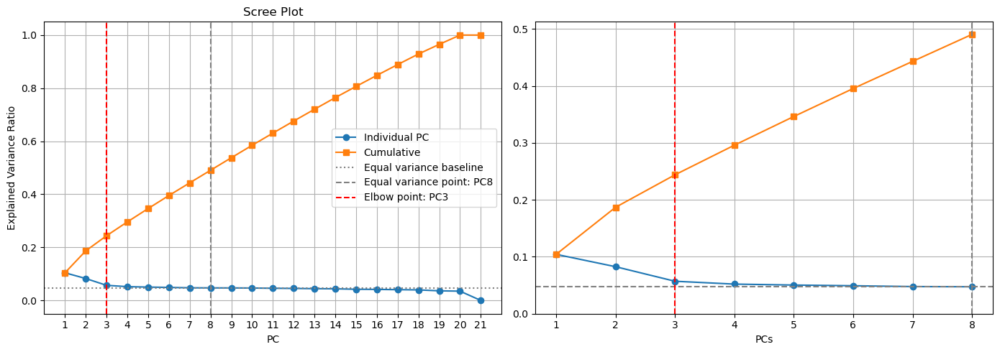

In [22]:
# Data prep
explained_var = pca.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)
pcs = np.arange(1, len(explained_var) + 1)

# Elbow detection via max second derivative
elbow_point = np.argmax(np.diff(np.diff(explained_var))) + 2

# Equal variance baseline cross-over point
equal_variance = 1 / len(explained_var)
equal_variance_point = np.argmax(explained_var <= equal_variance) + 1

# Zoom window (e.g., elbow ±5 PCs)
zoom_start = max(0, elbow_point - 5)
zoom_end = min(len(pcs), elbow_point + 5)
zoom_range = slice(zoom_start, zoom_end)

# Create two subplots WITHOUT shared y-axis
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# --- Left: Full scree plot ---
ax1.plot(pcs, explained_var, marker='o', label='Individual PC')
ax1.plot(pcs, cumulative_var, marker='s', linestyle='-', label='Cumulative')
ax1.axhline(equal_variance, color='gray', linestyle=':', label='Equal variance baseline')
ax1.axvline(equal_variance_point, color='gray', linestyle='--', label=f'Equal variance point: PC{equal_variance_point}')
ax1.axvline(elbow_point, color='red', linestyle='--', label=f'Elbow point: PC{elbow_point}')
ax1.set_xlabel("PC")
ax1.set_ylabel("Explained Variance Ratio")
ax1.set_title("Scree Plot")
ax1.set_xticks(pcs)
ax1.legend()
ax1.grid(True)

# --- Right: Zoomed-in plot ---
ax2.plot(pcs[zoom_range], explained_var[zoom_range], marker='o', label='Individual PC')
ax2.plot(pcs[zoom_range], cumulative_var[zoom_range], marker='s', linestyle='-', label='Cumulative')
ax2.axhline(equal_variance, color='gray', linestyle='--', label='Equal variance baseline')
ax2.axvline(equal_variance_point, color='gray', linestyle='--', label=f'Equal variance point: PC{equal_variance_point}')
ax2.axvline(elbow_point, color='red', linestyle='--', label=f'Elbow point: PC{elbow_point}')
ax2.set_ylim(0,None)
ax2.set_xlabel("PCs")
ax2.set_xticks(pcs[zoom_range])
ax2.grid(True)

plt.tight_layout()
plt.show()

# save fig
os.makedirs(root_directory + '/results/figures_astro_PCA', exist_ok=True)
fig.savefig(
    root_directory + '/results/figures_astro_PCA/astrocyte_clusters_PCA_scree_plot.png',
    dpi=300,
    bbox_inches='tight'
)

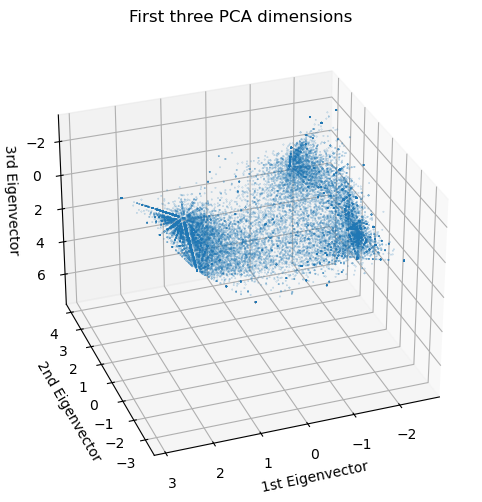

In [23]:
# Scatter plot of all sections PCs

fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d", elev=-150, azim=110)
scatter = ax.scatter(
    X_pca[:, 0], 
    X_pca[:, 1],
    X_pca[:, 2],
    s=0.05, 
    alpha=0.5
)
ax.set(
    title="First three PCA dimensions",
    xlabel="1st Eigenvector",
    ylabel="2nd Eigenvector",
    zlabel="3rd Eigenvector",
)
plt.show()

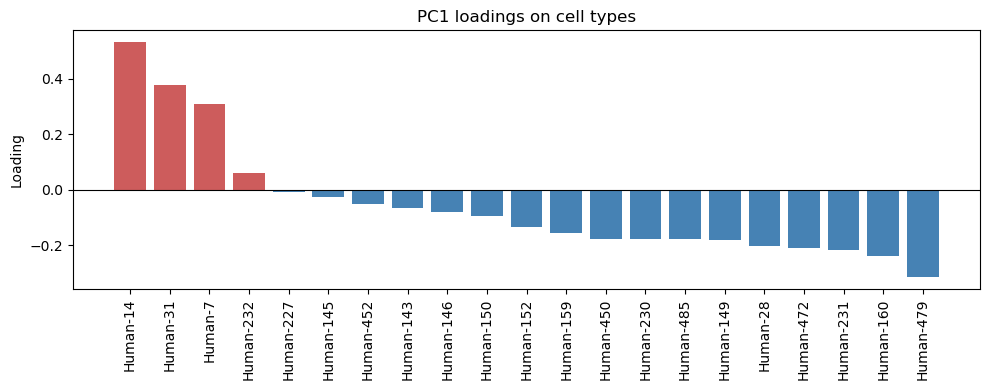

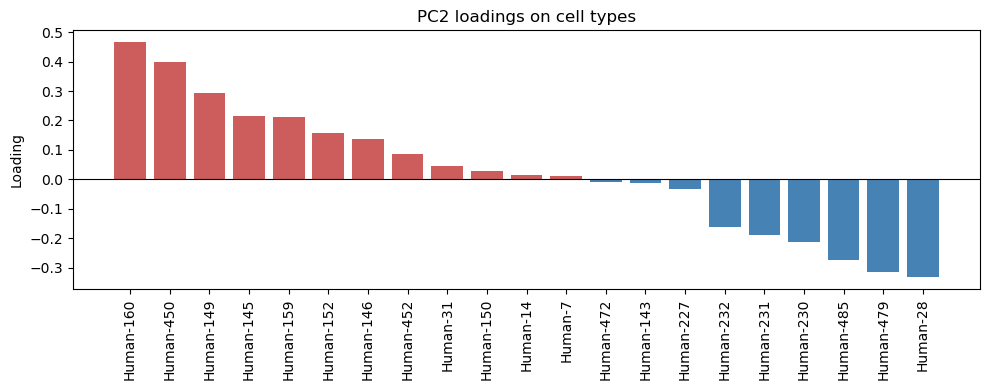

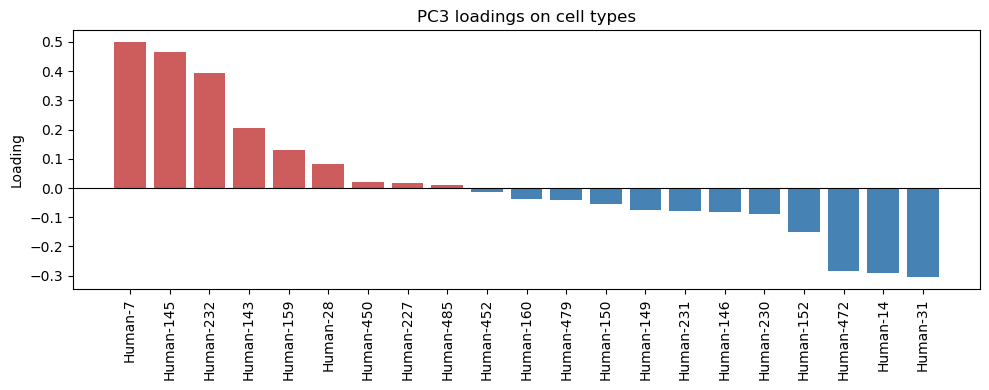

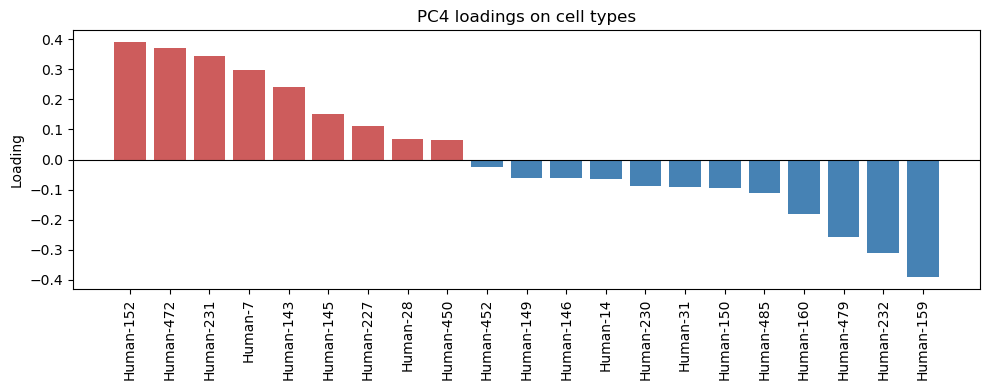

In [24]:
components = pca.components_  # shape (n_components, n_features)
pcs = [f"PC{i+1}" for i in range(components.shape[0])]

for i, pc in enumerate(pcs[:elbow_point+1]):  # or use a specific PC like 'PC1'
    sorted_idx = np.argsort(components[i])[::-1]
    components_sorted = components[i][sorted_idx]
    astro_clusters_sorted = astro_clusters[sorted_idx]
    colors = ['indianred' if v >= 0 else 'steelblue' for v in components_sorted]

    # plt.figure(figsize=(10, 4))
    fig_loadings, ax_loadings = plt.subplots(figsize=(10, 4))
    ax_loadings.bar(range(len(astro_clusters)), components_sorted, tick_label=astro_clusters_sorted, color=colors)
    ax_loadings.axhline(0, color='black', linewidth=0.8)
    plt.xticks(rotation=90)
    plt.ylabel("Loading")
    plt.title(f"{pc} loadings on cell types")
    plt.tight_layout()
    plt.show()

    # Save the figure
    os.makedirs(root_directory + "/results/figures_astro_PCA", exist_ok=True)
    fig_loadings.savefig(
        root_directory + f"/results/figures_astro_PCA/astrocyte_clusters_PCA_loadings_{pc}.png", 
        dpi=300, 
        bbox_inches='tight'
    )

In [44]:
Cluster_to_SpatialsubGroup = {
    "Human-14": "GM STR",
    "Human-7": "GM STR",
    "Human-31": "GM STR",
    "Human-160": "GM exSTR",
    "Human-146": "GM exSTR",
    "Human-149": "GM exSTR",
    "Human-450": "GM exSTR",
    "Human-159": "GM exSTR",
    "Human-150": "GM exSTR",
    "Human-145": "GM exSTR",
    "Human-452": "GM exSTR",
    "Human-152": "GM exSTR",
    "Human-28": "WM",
    "Human-231": "WM",
    "Human-479": "WM",
    "Human-472": "WM",
    "Human-230": "WM",
    "Human-485": "WM",
    "Human-227": "sparse", #from　spatial, too sparse. 
    "Human-143": "mixed",
    "Human-232": "mixed",
}

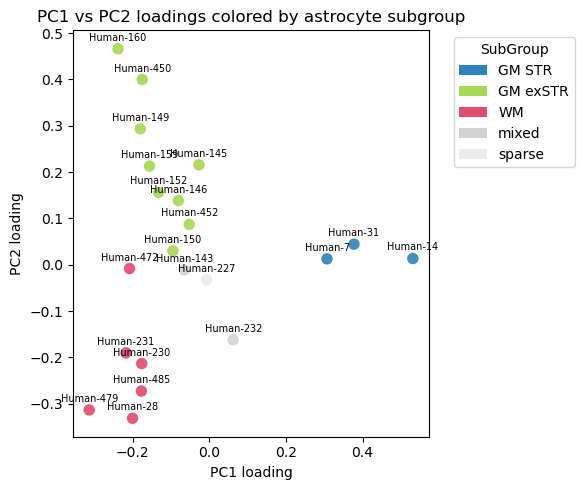

In [59]:
pc1_loadings = components[0]
pc2_loadings = components[1]

#get Spatail_subGroup label for each cluster
cluster_labels = np.array(astro_clusters)  # ['Human-14', 'Human-7', ...]
cluster_subgroups = np.array([Cluster_to_SpatialsubGroup[cl] for cl in cluster_labels])

# assign colors to subGroups
subgroup_colors = {
    "GM STR": "#2B83BA",
    "GM exSTR": "#A6D854",
    "WM": "#E24A6F",
    "mixed": "lightgray",
    "sparse": "#ECECEC",
}
colors = [subgroup_colors[sg] for sg in cluster_subgroups]


fig, ax = plt.subplots(figsize=(6, 5))


scatter = ax.scatter(
    pc1_loadings,
    pc2_loadings,
    color=colors,
    s=68,              # dot size
    edgecolor='none',   # no edge
    alpha=0.9
)

# label above
for i, label in enumerate(cluster_labels):
    ax.text(pc1_loadings[i], pc2_loadings[i] + 0.013, label, fontsize=7, ha='center', va='bottom')


#ax.axhline(0, color='gray', linewidth=0.5)
#ax.axvline(0, color='gray', linewidth=0.5)
ax.set_xlabel("PC1 loading")
ax.set_ylabel("PC2 loading")
ax.set_title("PC1 vs PC2 loadings colored by astrocyte subgroup")


from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor=color, label=label) for label, color in subgroup_colors.items()
]
ax.legend(handles=legend_elements, title="SubGroup", bbox_to_anchor=(1.05, 1), loc='upper left')

fig.savefig(
    root_directory + "/results/figures_astro_PCA/PC1_vs_PC2_loadings_colored_by_subgroup.pdf",
   # dpi=300,
    bbox_inches='tight',
    transparent=True #comment dpi and add transparent -> now can slightly move the labels a bit for better visualization. never move the dots.n
)


plt.tight_layout()
plt.show()


### Check the gene expression pattern on spatial

In [6]:
adata_human_astro

AnnData object with n_obs × n_vars = 198386 × 315
    obs: 'x', 'y', 'brain_section_label', 'brain_section_barcode', 'slab', 'block', 'set', 'z_order', 'total_counts', 'total_counts_genes', 'n_genes_by_counts', 'total_counts_Blank', 'pct_counts_Blank', 'genes_filter', 'counts_filter', 'blanks_filter', 'qc_pass', 'doublets_filter', 'qc_pass_and_singlet', 'doublet_singlet_score_diff', 'doublet_diff_threshold', 'hierarchy_consistent', 'Neighborhood', 'Neighborhood_bootstrapping_probability', 'Neighborhood_correlation_coefficient', 'Class', 'Class_bootstrapping_probability', 'Class_correlation_coefficient', 'Subclass', 'Subclass_bootstrapping_probability', 'Subclass_correlation_coefficient', 'Group', 'Group_bootstrapping_probability', 'Group_correlation_coefficient', 'cluster_id', 'cluster_id_bootstrapping_probability', 'cluster_id_correlation_coefficient', 'Neighborhood_entropy', 'Class_entropy', 'Subclass_entropy', 'Group_entropy', 'cluster_id_entropy', 'STAligner_mclust_res_10_knn_15', 

<Axes: title={'center': 'AQP4'}, xlabel='spatial_grid1', ylabel='spatial_grid2'>

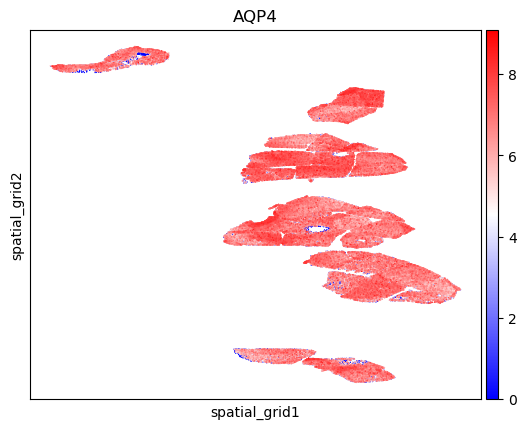

In [15]:
sc.pl.embedding(
    adata_human_astro,
    basis="spatial_grid", #"X_UMAP",
    color_map="bwr",
    color= "AQP4",
    show=False,
    ncols=4,
    use_raw=False,
    size=4,
    layer="log2cpt"
)

In [10]:
selected_sections2 = [6, 9, 12]
adata_human_astro2 = adata_human_astro[adata_human_astro.obs['z_order'].isin(selected_sections2)].copy()
adata_human_astro2

AnnData object with n_obs × n_vars = 154733 × 315
    obs: 'x', 'y', 'brain_section_label', 'brain_section_barcode', 'slab', 'block', 'set', 'z_order', 'total_counts', 'total_counts_genes', 'n_genes_by_counts', 'total_counts_Blank', 'pct_counts_Blank', 'genes_filter', 'counts_filter', 'blanks_filter', 'qc_pass', 'doublets_filter', 'qc_pass_and_singlet', 'doublet_singlet_score_diff', 'doublet_diff_threshold', 'hierarchy_consistent', 'Neighborhood', 'Neighborhood_bootstrapping_probability', 'Neighborhood_correlation_coefficient', 'Class', 'Class_bootstrapping_probability', 'Class_correlation_coefficient', 'Subclass', 'Subclass_bootstrapping_probability', 'Subclass_correlation_coefficient', 'Group', 'Group_bootstrapping_probability', 'Group_correlation_coefficient', 'cluster_id', 'cluster_id_bootstrapping_probability', 'cluster_id_correlation_coefficient', 'Neighborhood_entropy', 'Class_entropy', 'Subclass_entropy', 'Group_entropy', 'cluster_id_entropy', 'STAligner_mclust_res_10_knn_15', 

<Axes: title={'center': 'TMEM132C'}, xlabel='spatial_grid1', ylabel='spatial_grid2'>

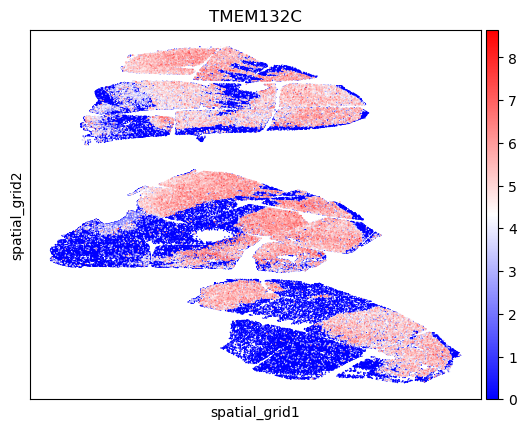

In [17]:
sc.pl.embedding(
    adata_human_astro2,
    basis="spatial_grid", #"X_UMAP",
    color_map="bwr",
    color= ["TMEM132C",,
    show=False,
    ncols=4,
    use_raw=False,
    size=4,
    layer="log2cpt"
)

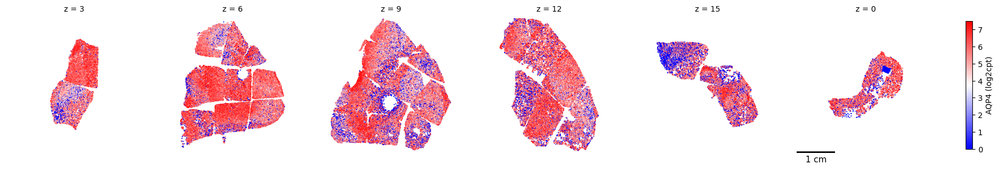

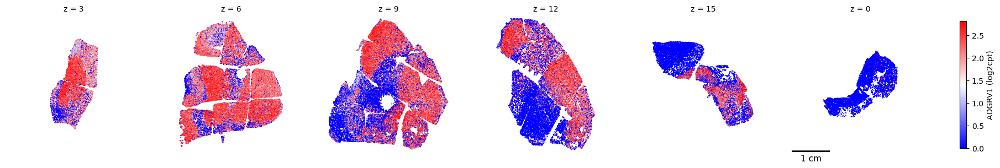

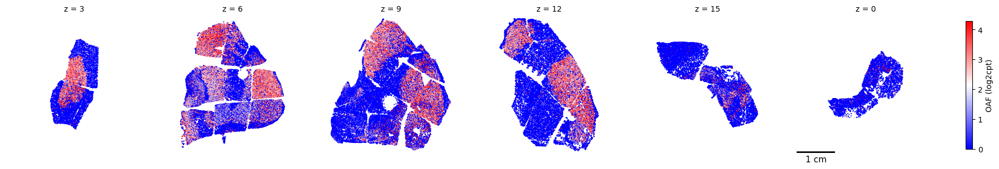

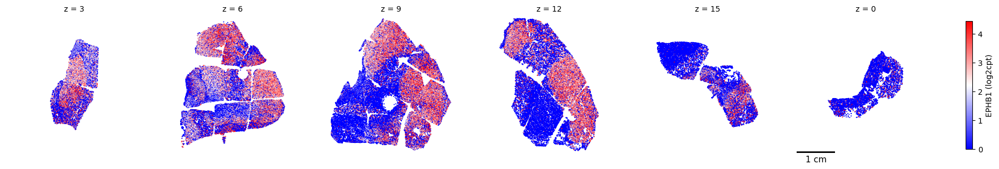

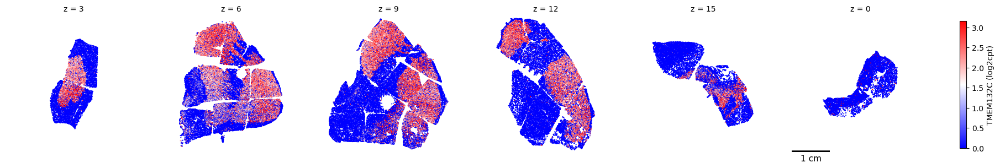

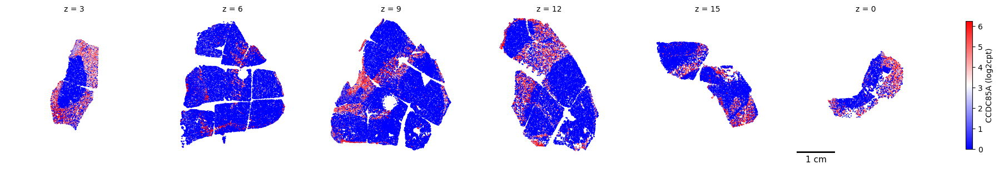

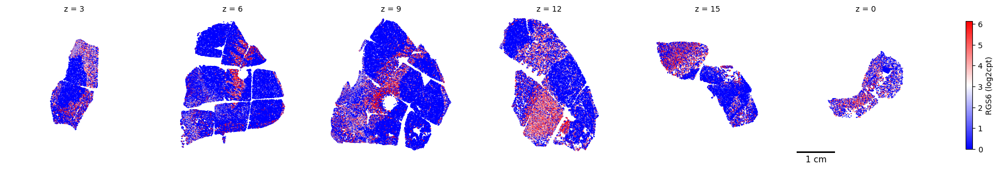

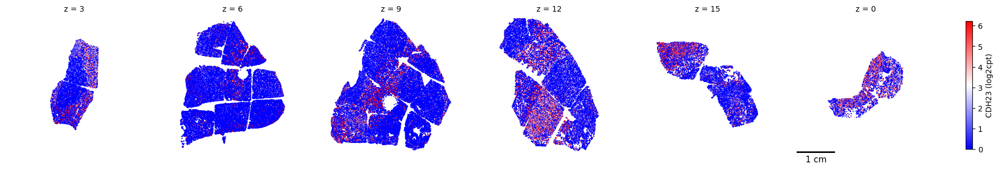

In [32]:
import scipy.sparse
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

genes_to_plot = ["AQP4", "ADGRV1", "OAF", 'EPHB1', "TMEM132C", 'CCDC85A', "RGS6", "CDH23"]
selected_sections = [3, 6, 9, 12, 15, 0]

# Plot canvas size
plot_size_um = 300 * 120
half_size = plot_size_um / 2

# 
for gene in genes_to_plot:
    fig, axes = plt.subplots(1, len(selected_sections), figsize=(20, 3), sharex=True, sharey=True)
    if len(selected_sections) == 1:
        axes = [axes]

    for ax, z in zip(axes, selected_sections):
        adata_subset = adata_human_astro[adata_human_astro.obs['z_order'] == z].copy()
        coords = adata_subset.obsm["spatial_grid"]

        # Get expression values from layer
        raw_expr = adata_subset.layers["log2cpt"][:, adata_subset.var_names.get_loc(gene)]
        expr = raw_expr.toarray().flatten() if scipy.sparse.issparse(raw_expr) else np.asarray(raw_expr).flatten()
        
        # Compute center for alignment
        x_min, x_max = coords[:, 0].min(), coords[:, 0].max()
        y_min, y_max = coords[:, 1].min(), coords[:, 1].max()
        center_x = (x_min + x_max) / 2
        center_y = (y_min + y_max) / 2
        center = np.array([center_x, center_y])
        shifted_coords = coords - center + half_size

        sc = ax.scatter(
            shifted_coords[:, 0],
            shifted_coords[:, 1],
            c=expr,
            s=2,
            cmap='bwr',
            vmin=np.percentile(expr, 2),
            vmax=np.percentile(expr, 98),
            linewidth=0,
            rasterized=True
        )
        ax.set_title(f'z = {z}', fontsize=10)
        ax.set_xlim(0, plot_size_um)
        ax.set_ylim(0, plot_size_um)
        ax.set_aspect('equal')
        ax.axis('off')

    # Add colorbar
    cbar = fig.colorbar(sc, ax=axes, fraction=0.015, pad=0.01)
    cbar.set_label(f"{gene} (log2cpt)", fontsize=10)

    # Add scalebar
    add_scalebar(
        axes[-1],
        matchx=False,
        matchy=False,
        hidex=True,
        hidey=True,
        loc='lower middle',
        fontsize=11,
        barcolor='black',
        barwidth=4,
        offset=(0.0, 0.0),
        sizex=10000,
        labelx='1 cm'
    )

    plt.tight_layout()
    
    plt.subplots_adjust(right=0.86, wspace=0.01) 
   # output_dir = root_directory + '/results/figures_astro_expression_patterns'
   # os.makedirs(output_dir, exist_ok=True)
   # fig.savefig(f"{output_dir}/{gene}_spatial_expression.png", dpi=300, bbox_inches='tight')
    plt.show()


#### for spatial Supp gene markers

In [13]:
import os
import scipy.sparse
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

genes_to_plot = ["AQP4", "ADGRV1", "TMEM132C", "OAF", 'EPHB1', 'CCDC85A', 'CD44', 
                 "RGS6", "CDH23", 'GPC5', 'DPP10', 'GRIK3', 'SEL1L3', 'SMOC1', 'VCAN', 'NTNG1', 'TSHZ2', 'FAM189A2']
selected_sections = [6, 9, 12, 15, 0] ### [3, 6, 9, 12, 15, 0]

# Plot canvas size
plot_size_um = 300 * 120
half_size = plot_size_um / 2

# Output directory
output_dir = os.path.join(root_directory, "results", "figures_astro_expression_patterns_pdf")
os.makedirs(output_dir, exist_ok=True)

for gene in genes_to_plot:
    fig, axes = plt.subplots(1, len(selected_sections), figsize=(12, 3), sharex=True, sharey=True)
    if len(selected_sections) == 1:
        axes = [axes]

    for ax, z in zip(axes, selected_sections):
        adata_subset = adata_human_astro[adata_human_astro.obs['z_order'] == z].copy()
        coords = adata_subset.obsm["spatial_grid"]

        # Get expression values
        raw_expr = adata_subset.layers["log2cpt"][:, adata_subset.var_names.get_loc(gene)]
        expr = raw_expr.toarray().flatten() if scipy.sparse.issparse(raw_expr) else np.asarray(raw_expr).flatten()
        
        # Center alignment
        x_min, x_max = coords[:, 0].min(), coords[:, 0].max()
        y_min, y_max = coords[:, 1].min(), coords[:, 1].max()
        center = np.array([(x_min + x_max) / 2, (y_min + y_max) / 2])
        shifted_coords = coords - center + half_size

        sc = ax.scatter(
            shifted_coords[:, 0],
            shifted_coords[:, 1],
            c=expr,
            s=2,
            cmap='bwr',
            vmin=np.percentile(expr, 2),
            vmax=np.percentile(expr, 98),
            linewidth=0,
            rasterized=True
        )
        ax.set_title(f'z = {z}', fontsize=10)
        ax.set_xlim(0, plot_size_um)
        ax.set_ylim(0, plot_size_um)
        ax.set_aspect('equal')
        ax.axis('off')

    # Colorbar
    cbar = fig.colorbar(sc, ax=axes, fraction=0.015, pad=0.01)
    cbar.set_label(f"{gene} (log2cpt)", fontsize=10)

    # Scalebar
    add_scalebar(
        axes[-1],
        matchx=False,
        matchy=False,
        hidex=True,
        hidey=True,
        loc='lower middle',
        fontsize=11,
        barcolor='black',
        barwidth=4,
        offset=(0.0, 0.0),
        sizex=10000,
        labelx='1 cm'
    )

    plt.tight_layout()
    plt.subplots_adjust(right=0.86, wspace=0.01)

    # Save one PDF per gene
    outfile = os.path.join(output_dir, f"{gene}_spatial_expression.pdf")
    fig.savefig(outfile, dpi=300, bbox_inches='tight', format="pdf")
    plt.close(fig)   # close to free memory

print("Done. Each gene saved as one PDF.")


Done. Each gene saved as one PDF.


### Show all genes on spatial

In [ ]:
gene_list = list(adata_subset.var_names)
selected_sections = [3, 6, 9, 12, 15, 0]
plot_size_um = 300 * 120
half_size = plot_size_um / 2

#output_dir = root_directory + '/results/astro_spatial_gene_patterns'
#os.makedirs(output_dir, exist_ok=True)

for gene in gene_list:
    fig, axes = plt.subplots(1, len(selected_sections), figsize=(20, 3), sharex=True, sharey=True)
    if len(selected_sections) == 1:
        axes = [axes]

    for ax, z in zip(axes, selected_sections):
        adata_subset = adata_human_astro[adata_human_astro.obs['z_order'] == z].copy()

        if adata_subset.n_obs == 0 or 'spatial_grid' not in adata_subset.obsm:
            ax.set_title(f'z = {z}\n(no data)')
            ax.axis('off')
            continue

        coords = adata_subset.obsm["spatial_grid"]

  
        if gene not in adata_subset.var_names:
            ax.set_title(f'{gene}\nnot found')
            ax.axis('off')
            continue

        raw_expr = adata_subset.layers["log2cpt"][:, adata_subset.var_names.get_loc(gene)]
        expr = raw_expr.toarray().flatten() if scipy.sparse.issparse(raw_expr) else np.asarray(raw_expr).flatten()

        
        x_min, x_max = coords[:, 0].min(), coords[:, 0].max()
        y_min, y_max = coords[:, 1].min(), coords[:, 1].max()
        center_x = (x_min + x_max) / 2
        center_y = (y_min + y_max) / 2
        center = np.array([center_x, center_y])
        shifted_coords = coords - center + half_size

       
        sc = ax.scatter(
            shifted_coords[:, 0],
            shifted_coords[:, 1],
            c=expr,
            s=2,
            cmap='bwr',
            vmin=np.percentile(expr, 2),
            vmax=np.percentile(expr, 98),
            linewidth=0,
            rasterized=True
        )
        ax.set_title(f'z = {z}', fontsize=9)
        ax.set_xlim(0, plot_size_um)
        ax.set_ylim(0, plot_size_um)
        ax.set_aspect('equal')
        ax.axis('off')

    # colorbar
    cbar = fig.colorbar(sc, ax=axes, fraction=0.015, pad=0.01)
    cbar.set_label(f"{gene} (log2cpt)", fontsize=10)

    # scalebar
    add_scalebar(
        axes[-1],
        matchx=False,
        matchy=False,
        hidex=True,
        hidey=True,
        loc='lower middle',
        fontsize=10,
        barcolor='black',
        barwidth=4,
        offset=(0.0, 0.0),
        sizex=10000,
        labelx='1 cm'
    )

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.01, right=0.86)

   # fig.savefig(f"{output_dir}/{gene}_spatial.png", dpi=300, bbox_inches='tight')
    plt.show()
   # plt.close(fig)

### show good gene markers' patterns on Spatial

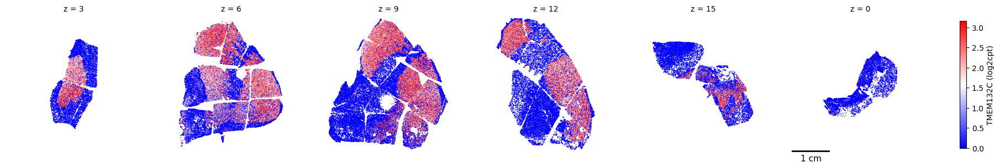

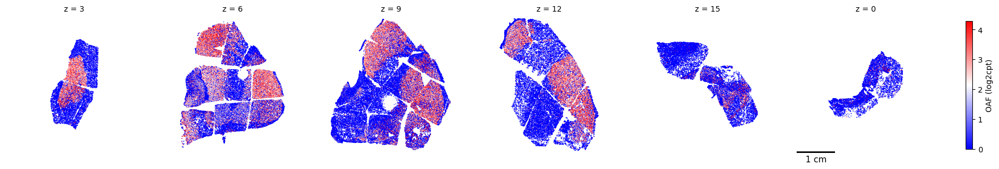

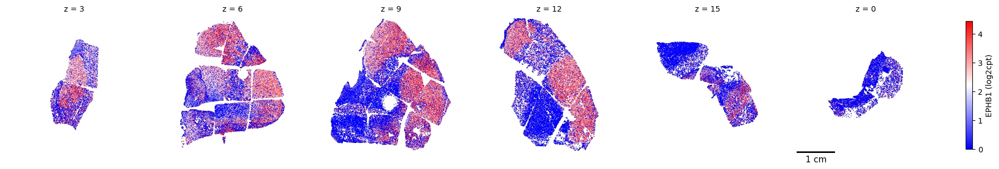

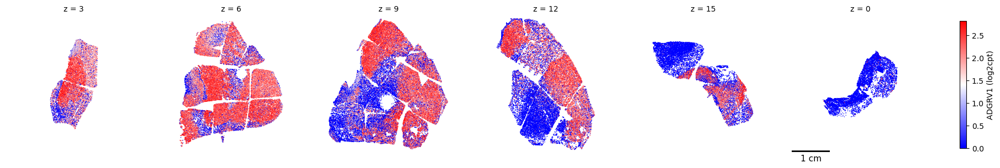

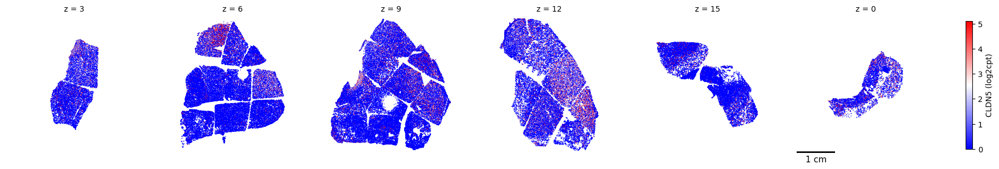

...

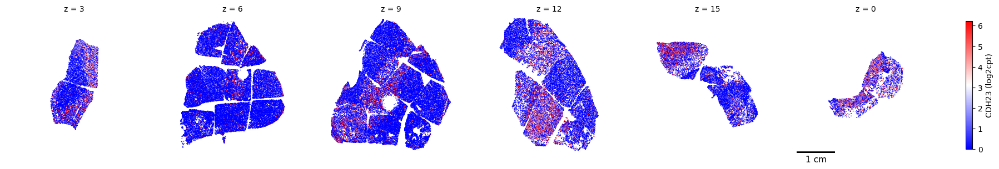

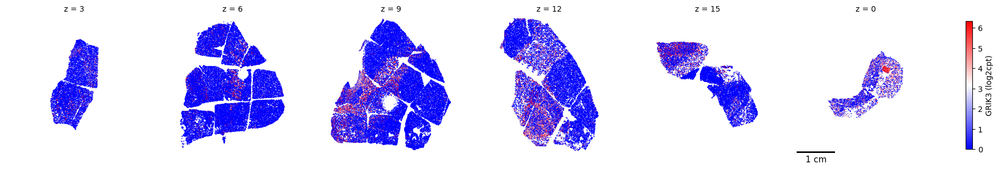

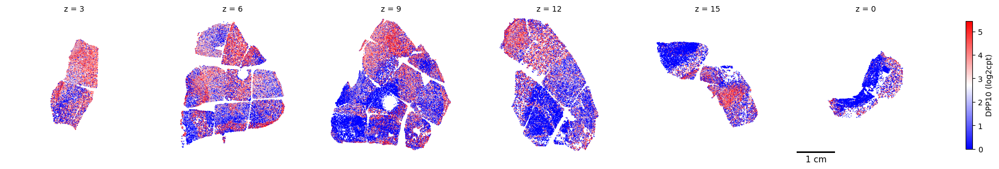

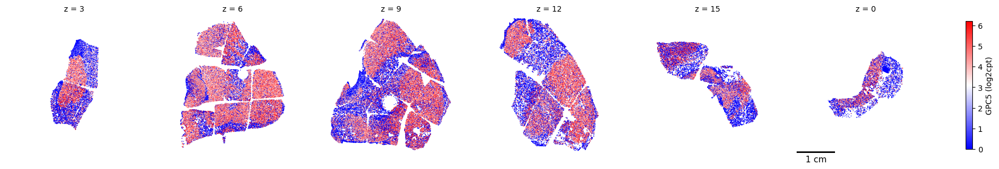

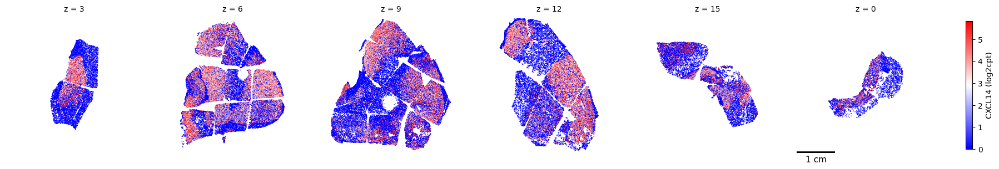

In [40]:
import scipy.sparse
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

genes_to_plot = [#"AQP4", "WLS", 
                 "TMEM132C", "OAF", 'EPHB1', "ADGRV1", #'SEL1L3', #GM STR
                 'CLDN5', 'CNR1', #dorsal STR?!
                 'CPNE8', #ventral STR?
                 'CCDC85A', 'CD44', 'SMOC1', 'FRMPD3', # WM #vcan (wm +gp) #'ANGPT1',
                 #'COL12A1', #GM exSTR??
                 "RGS6", "CDH23", 'GRIK3', #'ADCY8', # GM exSTR + WM; tnc/gfap
                 "DPP10", # GM STR + WM
                 'GPC5', 'CXCL14', # GMs #'ETV1',
                ]
selected_sections = [3, 6, 9, 12, 15, 0]

# Plot canvas size
plot_size_um = 300 * 120
half_size = plot_size_um / 2

# 
for gene in genes_to_plot:
    fig, axes = plt.subplots(1, len(selected_sections), figsize=(20, 3), sharex=True, sharey=True)
    if len(selected_sections) == 1:
        axes = [axes]

    for ax, z in zip(axes, selected_sections):
        adata_subset = adata_human_astro[adata_human_astro.obs['z_order'] == z].copy()
        coords = adata_subset.obsm["spatial_grid"]

        # Get expression values from layer
        raw_expr = adata_subset.layers["log2cpt"][:, adata_subset.var_names.get_loc(gene)]
        expr = raw_expr.toarray().flatten() if scipy.sparse.issparse(raw_expr) else np.asarray(raw_expr).flatten()
        
        # Compute center for alignment
        x_min, x_max = coords[:, 0].min(), coords[:, 0].max()
        y_min, y_max = coords[:, 1].min(), coords[:, 1].max()
        center_x = (x_min + x_max) / 2
        center_y = (y_min + y_max) / 2
        center = np.array([center_x, center_y])
        shifted_coords = coords - center + half_size

        sc = ax.scatter(
            shifted_coords[:, 0],
            shifted_coords[:, 1],
            c=expr,
            s=1, #dot size
            cmap='bwr',
            vmin=np.percentile(expr, 2),
            vmax=np.percentile(expr, 98),
            linewidth=0,
            rasterized=True
        )
        ax.set_title(f'z = {z}', fontsize=10)
        ax.set_xlim(0, plot_size_um)
        ax.set_ylim(0, plot_size_um)
        ax.set_aspect('equal')
        ax.axis('off')

    # Add colorbar
    cbar = fig.colorbar(sc, ax=axes, fraction=0.015, pad=0.01)
    cbar.set_label(f"{gene} (log2cpt)", fontsize=10)

    # Add scalebar
    add_scalebar(
        axes[-1],
        matchx=False,
        matchy=False,
        hidex=True,
        hidey=True,
        loc='lower middle',
        fontsize=11,
        barcolor='black',
        barwidth=4,
        offset=(0.0, 0.0),
        sizex=10000,
        labelx='1 cm'
    )

    plt.tight_layout()
    
    plt.subplots_adjust(right=0.86, wspace=0.01) 
   # output_dir = root_directory + '/results/figures_astro_expression_patterns'
   # os.makedirs(output_dir, exist_ok=True)
   # fig.savefig(f"{output_dir}/{gene}_spatial_expression.png", dpi=300, bbox_inches='tight')
    plt.show()


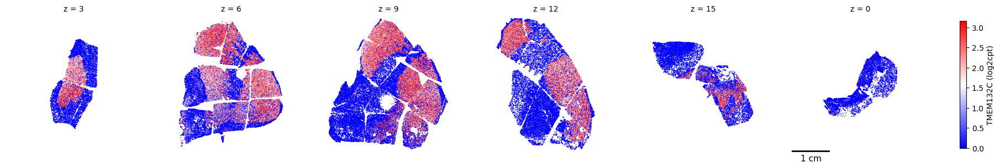

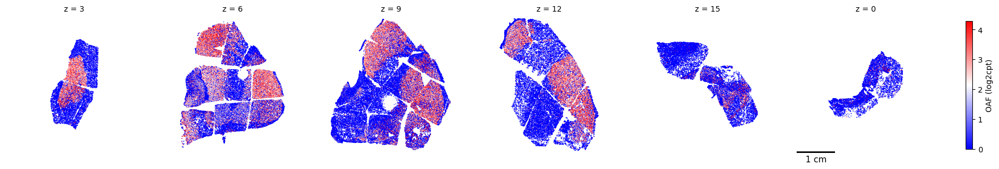

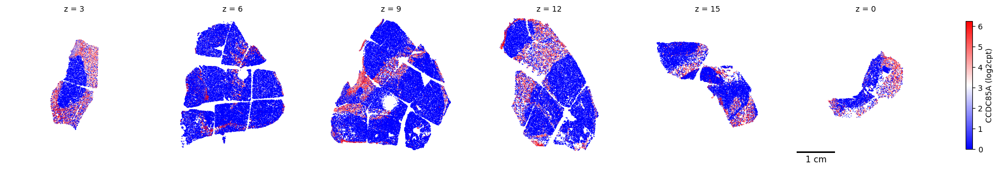

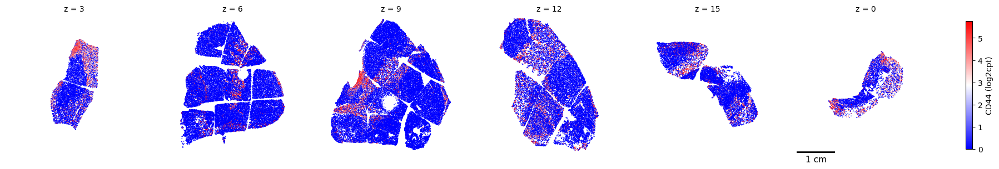

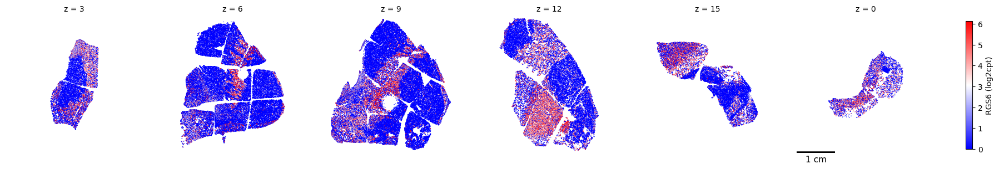

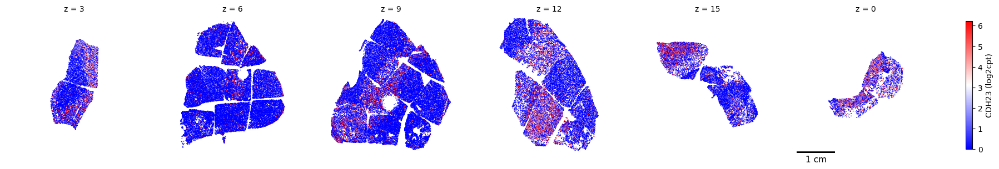

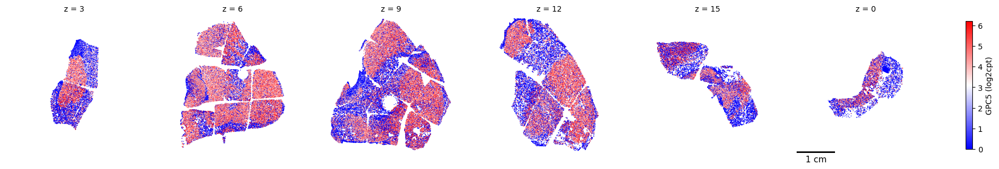

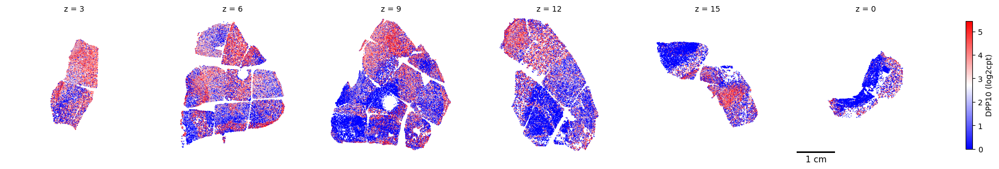

In [41]:
import scipy.sparse
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

genes_to_plot = [#"AQP4", "WLS", 
                 "TMEM132C", "OAF", #'EPHB1', "ADGRV1", #'SEL1L3', #GM STR
                 #'CLDN5', 'CNR1', #dorsal STR?!
                 #'CPNE8', #ventral STR?
                 'CCDC85A', 'CD44', #'SMOC1', 'FRMPD3', # WM #vcan (wm +gp) #'ANGPT1',
                 #'COL12A1', #GM exSTR??
                 "RGS6", "CDH23", #'GRIK3', #'ADCY8', # GM exSTR + WM; tnc/gfap
                 'GPC5', #'CXCL14', # GMs #'ETV1',
                 "DPP10", # GM STR + WM
                ]
selected_sections = [3, 6, 9, 12, 15, 0]

# Plot canvas size
plot_size_um = 300 * 120
half_size = plot_size_um / 2

# 
for gene in genes_to_plot:
    fig, axes = plt.subplots(1, len(selected_sections), figsize=(20, 3), sharex=True, sharey=True)
    if len(selected_sections) == 1:
        axes = [axes]

    for ax, z in zip(axes, selected_sections):
        adata_subset = adata_human_astro[adata_human_astro.obs['z_order'] == z].copy()
        coords = adata_subset.obsm["spatial_grid"]

        # Get expression values from layer
        raw_expr = adata_subset.layers["log2cpt"][:, adata_subset.var_names.get_loc(gene)]
        expr = raw_expr.toarray().flatten() if scipy.sparse.issparse(raw_expr) else np.asarray(raw_expr).flatten()
        
        # Compute center for alignment
        x_min, x_max = coords[:, 0].min(), coords[:, 0].max()
        y_min, y_max = coords[:, 1].min(), coords[:, 1].max()
        center_x = (x_min + x_max) / 2
        center_y = (y_min + y_max) / 2
        center = np.array([center_x, center_y])
        shifted_coords = coords - center + half_size

        sc = ax.scatter(
            shifted_coords[:, 0],
            shifted_coords[:, 1],
            c=expr,
            s=1, #dot size
            cmap='bwr',
            vmin=np.percentile(expr, 2),
            vmax=np.percentile(expr, 98),
            linewidth=0,
            rasterized=True
        )
        ax.set_title(f'z = {z}', fontsize=10)
        ax.set_xlim(0, plot_size_um)
        ax.set_ylim(0, plot_size_um)
        ax.set_aspect('equal')
        ax.axis('off')

    # Add colorbar
    cbar = fig.colorbar(sc, ax=axes, fraction=0.015, pad=0.01)
    cbar.set_label(f"{gene} (log2cpt)", fontsize=10)

    # Add scalebar
    add_scalebar(
        axes[-1],
        matchx=False,
        matchy=False,
        hidex=True,
        hidey=True,
        loc='lower middle',
        fontsize=11,
        barcolor='black',
        barwidth=4,
        offset=(0.0, 0.0),
        sizex=10000,
        labelx='1 cm'
    )

    plt.tight_layout()
    
    plt.subplots_adjust(right=0.86, wspace=0.01) 
   # output_dir = root_directory + '/results/figures_astro_expression_patterns'
   # os.makedirs(output_dir, exist_ok=True)
   # fig.savefig(f"{output_dir}/{gene}_spatial_expression.png", dpi=300, bbox_inches='tight')
    plt.show()


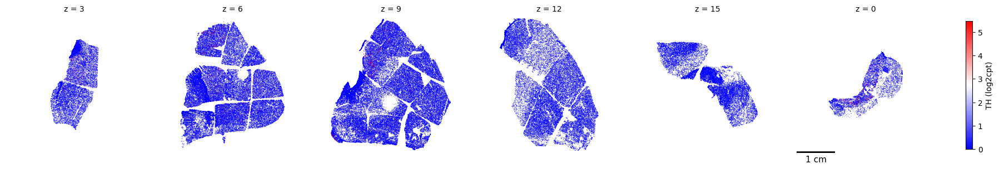

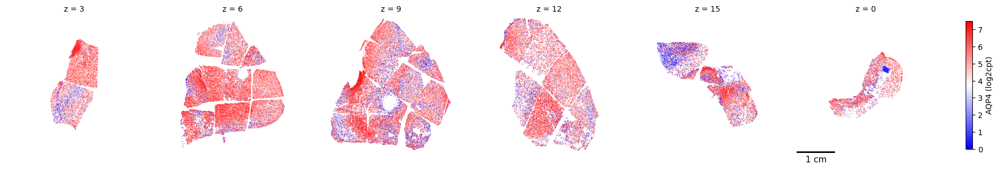

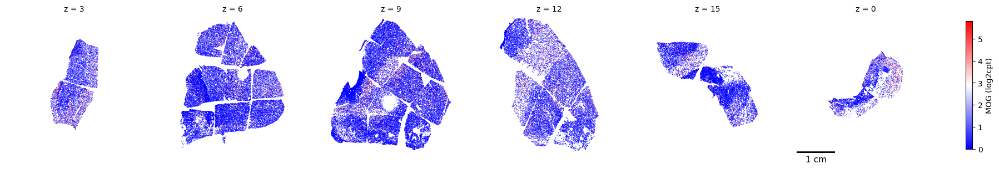

In [16]:
import scipy.sparse
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

genes_to_plot = ['TH', 'AQP4', 'MOG']
selected_sections = [3, 6, 9, 12, 15, 0]

# Plot canvas size
plot_size_um = 300 * 120
half_size = plot_size_um / 2

# 
for gene in genes_to_plot:
    fig, axes = plt.subplots(1, len(selected_sections), figsize=(20, 3), sharex=True, sharey=True)
    if len(selected_sections) == 1:
        axes = [axes]

    for ax, z in zip(axes, selected_sections):
        adata_subset = adata_human_astro[adata_human_astro.obs['z_order'] == z].copy()
        coords = adata_subset.obsm["spatial_grid"]

        # Get expression values from layer
        raw_expr = adata_subset.layers["log2cpt"][:, adata_subset.var_names.get_loc(gene)]
        expr = raw_expr.toarray().flatten() if scipy.sparse.issparse(raw_expr) else np.asarray(raw_expr).flatten()
        
        # Compute center for alignment
        x_min, x_max = coords[:, 0].min(), coords[:, 0].max()
        y_min, y_max = coords[:, 1].min(), coords[:, 1].max()
        center_x = (x_min + x_max) / 2
        center_y = (y_min + y_max) / 2
        center = np.array([center_x, center_y])
        shifted_coords = coords - center + half_size

        sc = ax.scatter(
            shifted_coords[:, 0],
            shifted_coords[:, 1],
            c=expr,
            s=0.4, #dot size
            cmap='bwr',
            vmin=np.percentile(expr, 2),
            vmax=np.percentile(expr, 98),
            linewidth=0,
            rasterized=True
        )
        ax.set_title(f'z = {z}', fontsize=10)
        ax.set_xlim(0, plot_size_um)
        ax.set_ylim(0, plot_size_um)
        ax.set_aspect('equal')
        ax.axis('off')

    # Add colorbar
    cbar = fig.colorbar(sc, ax=axes, fraction=0.015, pad=0.01)
    cbar.set_label(f"{gene} (log2cpt)", fontsize=10)

    # Add scalebar
    add_scalebar(
        axes[-1],
        matchx=False,
        matchy=False,
        hidex=True,
        hidey=True,
        loc='lower middle',
        fontsize=11,
        barcolor='black',
        barwidth=4,
        offset=(0.0, 0.0),
        sizex=10000,
        labelx='1 cm'
    )

    plt.tight_layout()
    
    plt.subplots_adjust(right=0.86, wspace=0.01) 
   # output_dir = root_directory + '/results/figures_astro_expression_patterns'
   # os.makedirs(output_dir, exist_ok=True)
   # fig.savefig(f"{output_dir}/{gene}_spatial_expression.png", dpi=300, bbox_inches='tight')
    plt.show()


### spatial neighborhood enrichment analysis （dorsal reactive astro)

In [18]:
adata_human_structure ## astro_human + qc_pass

AnnData object with n_obs × n_vars = 5425175 × 315
    obs: 'x', 'y', 'brain_section_label', 'brain_section_barcode', 'slab', 'block', 'set', 'z_order', 'total_counts', 'total_counts_genes', 'n_genes_by_counts', 'total_counts_Blank', 'pct_counts_Blank', 'genes_filter', 'counts_filter', 'blanks_filter', 'qc_pass', 'doublets_filter', 'qc_pass_and_singlet', 'doublet_singlet_score_diff', 'doublet_diff_threshold', 'hierarchy_consistent', 'Neighborhood', 'Neighborhood_bootstrapping_probability', 'Neighborhood_correlation_coefficient', 'Class', 'Class_bootstrapping_probability', 'Class_correlation_coefficient', 'Subclass', 'Subclass_bootstrapping_probability', 'Subclass_correlation_coefficient', 'Group', 'Group_bootstrapping_probability', 'Group_correlation_coefficient', 'cluster_id', 'cluster_id_bootstrapping_probability', 'cluster_id_correlation_coefficient', 'Neighborhood_entropy', 'Class_entropy', 'Subclass_entropy', 'Group_entropy', 'cluster_id_entropy', 'STAligner_mclust_res_10_knn_15',

In [26]:
print(set(adata_human_structure.obs['anatomical_structure']))
set(adata_human_structure.obs['Class'])

{'GPe', 'STR', 'VP', 'adjacent', 'SN', 'STH', 'GPi'}


{'Adjacent',
 'Astro-Epen',
 'CN CGE GABA',
 'CN GABA-Glut',
 'CN LGE GABA',
 'CN MGE GABA',
 'Cx GABA',
 'F M GABA',
 'F M Glut',
 'Immune',
 'M Dopa',
 'OPC-Oligo',
 'Vascular'}